In [1]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy
import sys
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import ticker
#ccrs.PlateCarree()
import numpy as np
import pandas as pd
from matplotlib import gridspec
from math import radians, degrees, copysign, sin, cos, sqrt, atan,atan2

In [2]:
data_crs = ccrs.PlateCarree()

In [3]:
data = pd.read_csv('aurora_scene_00004_0512_v1_r0.nointrp.csv'
                   ,dtype={'float': 'str'},sep=',')
data.tail()
#print(data['lon'])

,lon,lat,sza,alt,O I 1152 A,O I 1304 A,O I 1356 A,O I 1641 A,N I 1134 A,N I 1200 A,...,N I 1493 A,N I 1743 A,H I Lyman alpha,N2 BH1,N2 LBH,LBH(1380-1390),LBH(1370-1480),N2 VK,NO bands,full pass
262139,50.923195,70.685692,81.871048,2447.404297,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
262140,51.161430,70.767128,81.851555,2464.591797,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
262141,51.400307,70.848068,81.832001,2481.810791,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
262142,51.639835,70.928505,81.812386,2499.059814,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
262143,51.879997,71.008453,81.792702,2516.344727,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
dataondisk = pd.read_csv('aurora_scene_00004_0512_v1_r0.nointrp_ondisk.csv'
                   ,dtype={'float': 'str'},sep=',')
dataondisk.head()
#print(data['lon'])

,lon,lat,sza,O I 1152 A,O I 1304 A,O I 1356 A,O I 1641 A,N I 1134 A,N I 1200 A,N I 1243 A,N I 1493 A,N I 1743 A,H I Lyman alpha,N2 BH1,N2 LBH,LBH(1380-1390),LBH(1370-1480),N2 VK,NO bands,full pass
0,-145.047653,-33.659813,77.784195,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,-144.239380,-32.761036,76.690849,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,-143.719971,-32.073257,75.913879,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,-143.333496,-31.483969,75.283646,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,-143.028183,-30.955641,74.743767,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [5]:
sat_lat = 26.7377
sat_lon = -90.2365
sat_lon

-90.2365

In [6]:
data_subsolar = data[data['sza']<2.]
data_subsolar.head()
# iss=np.where((data['sza'] < 2))
# issl=iss[0][0]#(data['lat'])[iss]
# issr=iss[0][-1]
# print(iss)
#print(data_subpolar.sza)
# print(issl,issr)
lat_subsol=data_subsolar['lat'].mean()
lon_subsol=data_subsolar['lon'].mean()
print('mean lat of subsolar region:',lat_subsol)
print('mean lon of subsolar region:',lon_subsol)

mean lat of subsolar region: 23.409910052492997
mean lon of subsolar region: -89.4942817582633


### All points

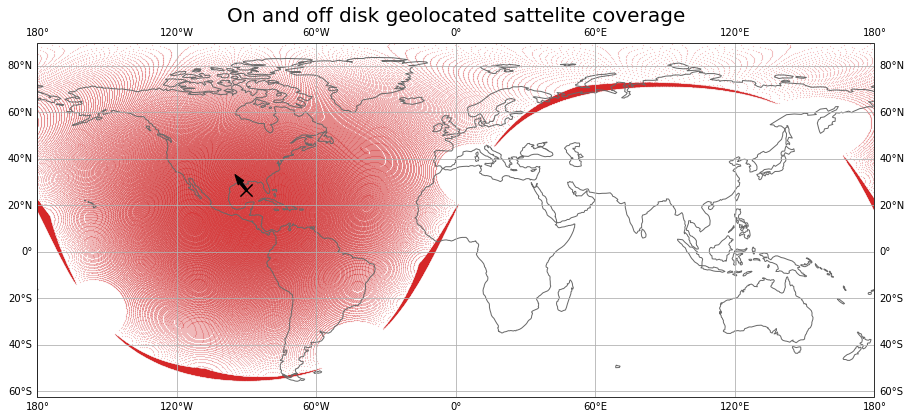

In [7]:
#checking points on map:
fig =plt.figure(figsize=[15,18])
ax=fig.add_subplot()


ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines(color='dimgrey')
ax.gridlines(draw_labels=True)
#plt.scatter(data['east_longitude'],data['geocentric_lat'],marker='o',s=10)
ax.scatter(data['lon'],data['lat'],marker='o',s=0.01, c='tab:red')
ax.scatter(sat_lon,sat_lat, marker='x', s=150, c='k')
ax.set_title('On and off disk geolocated sattelite coverage', fontsize=20)
ax.arrow(sat_lon,sat_lat,(-90.2387-sat_lon)*1000,(26.7407-sat_lat)*1000,color='k',width=1)

### On disk points

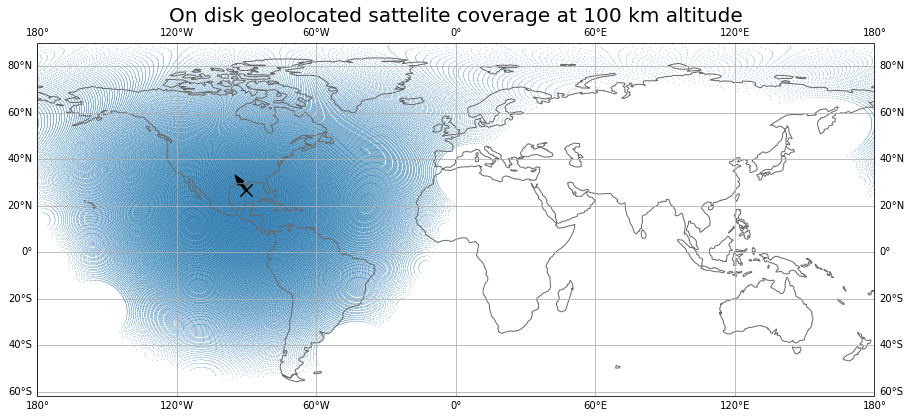

In [8]:
#checking on disk points on map:
fig =plt.figure(figsize=[15,18])
ax=fig.add_subplot()


ax = plt.axes(projection=ccrs.PlateCarree())

#plt.scatter(data['east_longitude'],data['geocentric_lat'],marker='o',s=10)
ax.scatter(dataondisk['lon'],dataondisk['lat'],marker='o',s=0.01, c='tab:blue')
ax.scatter(sat_lon,sat_lat, marker='x', s=150, c='k')
ax.set_title('On disk geolocated sattelite coverage at 100 km altitude', fontsize=20)
ax.arrow(sat_lon,sat_lat,(-90.2387-sat_lon)*1000,(26.7407-sat_lat)*1000,color='k',width=1)

ax.coastlines(color='dimgrey')
ax.gridlines(draw_labels=True)

### solar zenith angles

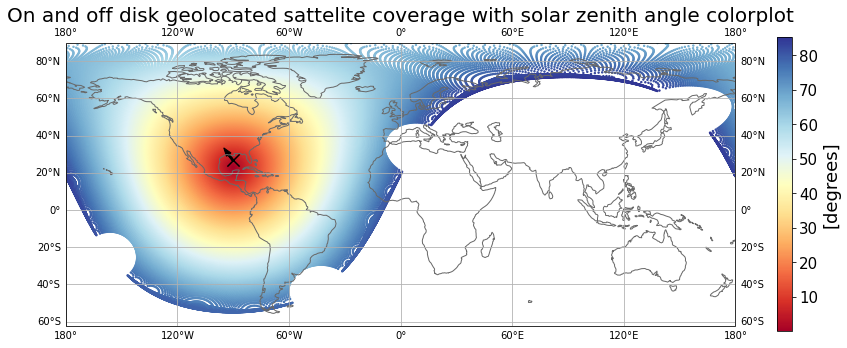

In [9]:
fig =plt.figure(figsize=[15,18])
ax = fig.add_subplot()
ax = plt.axes(projection=ccrs.PlateCarree())
cm = plt.cm.get_cmap('RdYlBu')
z = np.array(data['sza'])

sc = plt.scatter(data['lon'],data['lat'],
              marker='o',s=2,  c=z, 
              norm = mpl.colors.Normalize(vmin=z.min(), vmax=z.max()),
              cmap=cm,transform=data_crs)
cb=plt.colorbar(sc,shrink=.30)
cb.set_label('[degrees]',size=18)
cb.ax.tick_params(labelsize=15)
ax.scatter(sat_lon,sat_lat, marker='x', s=150, c='k')
ax.arrow(sat_lon,sat_lat,(-90.2387-sat_lon)*1000,(26.7407-sat_lat)*1000,color='k',width=1)
ax.coastlines(color='dimgrey')
ax.gridlines(draw_labels=True)
plt.title('On and off disk geolocated sattelite coverage with solar zenith angle colorplot', fontsize=20)
plt.show()

## Solar Zenith Angle 

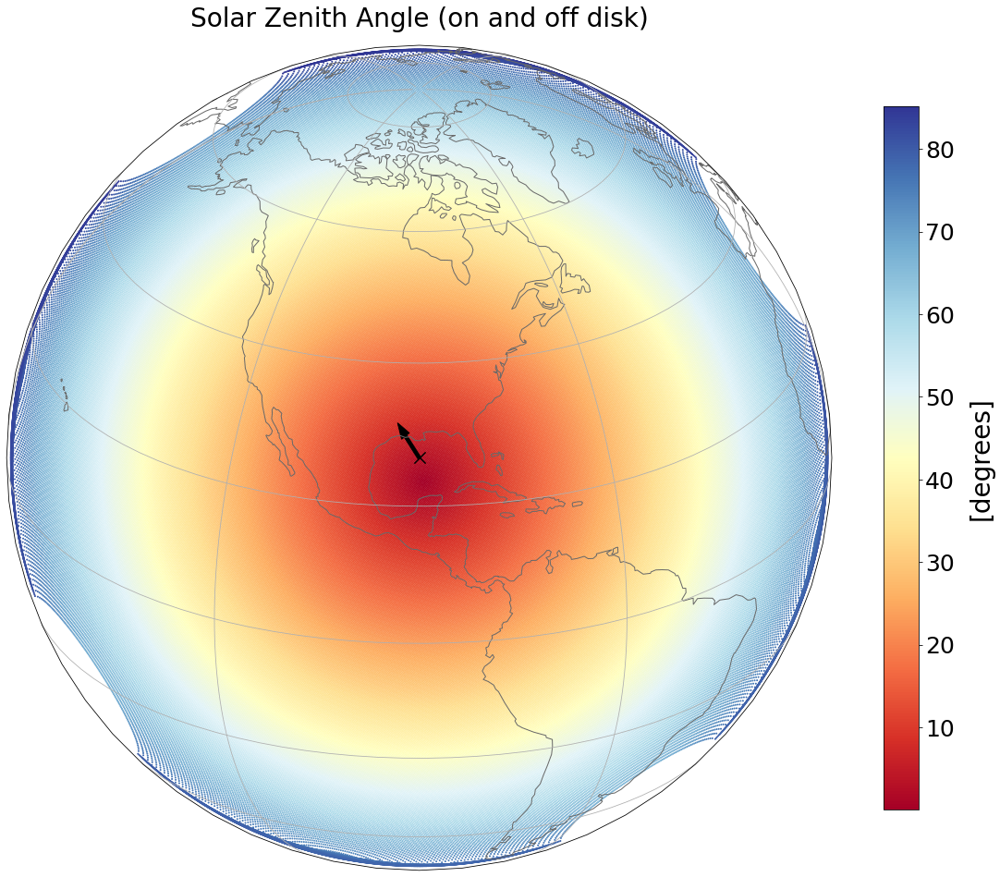

In [10]:
fig =plt.figure(figsize=[20, 20])

#ax = fig.add_subplot()

data_crs = ccrs.PlateCarree()
globe = ccrs.Geocentric()
ax = fig.add_subplot(projection=ccrs.Orthographic(sat_lon,sat_lat))
#ax.add_feature(cartopy.feature.OCEAN, zorder=0)




height = np.array(data['sza'])



cm = plt.cm.get_cmap('RdYlBu')

im=plt.scatter(data['lon'],data['lat'],
             marker='o',s=1, 
             c=height, 
             norm = mpl.colors.Normalize(vmin=height.min(), vmax=height.max()),
              cmap=cm,transform=data_crs)


cb=plt.colorbar(im,shrink=.70)
cb.set_label('[degrees]',size=28,labelpad=15)
cb.ax.tick_params(labelsize=25)

ax.set_title('Solar Zenith Angle (on and off disk)',size=28,pad=20)
ax.scatter(sat_lon,sat_lat, marker='x', s=150, c='k',transform=data_crs)
ax.arrow(sat_lon,sat_lat,(-90.2387-sat_lon)*1000,(26.7407-sat_lat)*1000,color='k',width=0.5,transform=data_crs)

#ax.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='black',linewidth=0.8)
ax.coastlines(color='dimgrey')
ax.set_global()
ax.gridlines()
# #plt.savefig('SZA.pdf')

## LBH (1370-1480)

In [12]:
print(max(data['LBH(1370-1480)']), min(data['LBH(1370-1480)']))

15100.0 0.0


In [13]:

def find_general_properties(dat,label):
    print(f'maximum value {label}:',max(dat[label]))
    imax = dat[label].argmax()
    #print('location of max:',imax)
    lat_imax=dat['lat'][imax]
    lon_imax=dat['lon'][imax]
    print('lat of max:',lat_imax)
    print('lon of max:',lon_imax)
    data_subsolar = dat[dat['sza']<2.]
    lat_subsol=data_subsolar['lat'].mean()
    lon_subsol=data_subsolar['lon'].mean()
    print('mean lat of subsolar region:',lat_subsol)
    print('mean lon of subsolar region:',lon_subsol)
    print(f'maximum value {label} in subsolar region:',max(data_subsolar[label]))
    meanRad_subsol=data_subsolar[label].mean()
    print('mean radiance of subsolar region:',meanRad_subsol)
    data_subsatelite=dat[((abs(dat['lat']-sat_lat)<2) & (abs(dat['lon']-(sat_lon))<2))]

    print('mean lat of sub-sattelie region:',data_subsatelite['lat'].mean())
    print('mean lon of sub-sattelite region:',data_subsatelite['lon'].mean())
    print(f'maximum value {label} in sub-sattelite region:',max(data_subsatelite[label]))
    meanRad_subsat=data_subsatelite[label].mean()
    print('mean radiance of subsattelite region:',meanRad_subsat)
    
find_general_properties(data,'LBH(1370-1480)')        
   

maximum value LBH(1370-1480): 15100.0
lat of max: 68.68434143
lon of max: 121.9042511
mean lat of subsolar region: 23.409910052492997
mean lon of subsolar region: -89.4942817582633
maximum value LBH(1370-1480) in subsolar region: 0.0
mean radiance of subsolar region: 0.0
mean lat of sub-sattelie region: 26.73032424968137
mean lon of sub-sattelite region: -90.24126905561275
maximum value LBH(1370-1480) in sub-sattelite region: 0.0
mean radiance of subsattelite region: 0.0


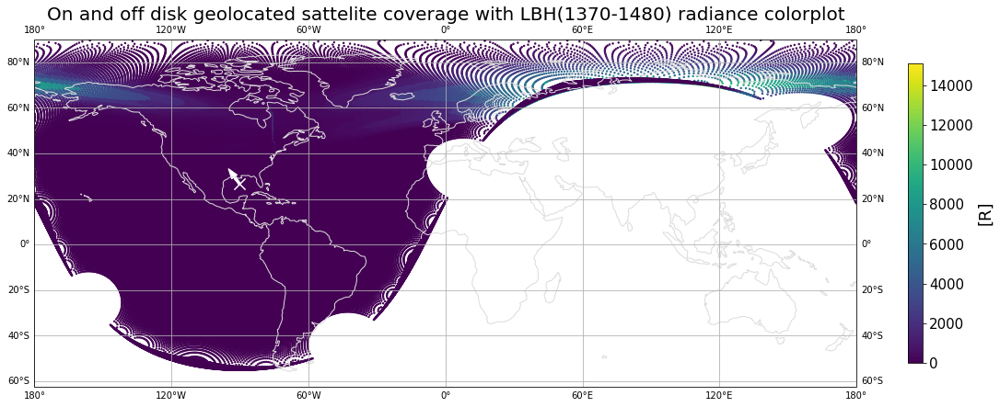

In [14]:
fig =plt.figure(figsize=[20,20])
ax = fig.add_subplot()
ax = plt.axes(projection=ccrs.PlateCarree())
cm = plt.cm.get_cmap('viridis')
z = np.array(data['LBH(1370-1480)'])

sc = plt.scatter(data['lon'],data['lat'],
              marker='o',s=2,  c=z, 
              norm = mpl.colors.Normalize(vmin=z.min(), vmax=z.max()),
              cmap=cm,transform=data_crs)
cb=plt.colorbar(sc,shrink=.30)
cb.set_label('[R]',size=18)
cb.ax.tick_params(labelsize=15)
ax.scatter(sat_lon,sat_lat, marker='x', s=150, c='w')
ax.arrow(sat_lon,sat_lat,(-90.2387-sat_lon)*1000,(26.7407-sat_lat)*1000,color='w',width=1)
ax.coastlines(color='gainsboro')
ax.gridlines(draw_labels=True)
plt.title('On and off disk geolocated sattelite coverage with LBH(1370-1480) radiance colorplot', fontsize=20)
plt.show()

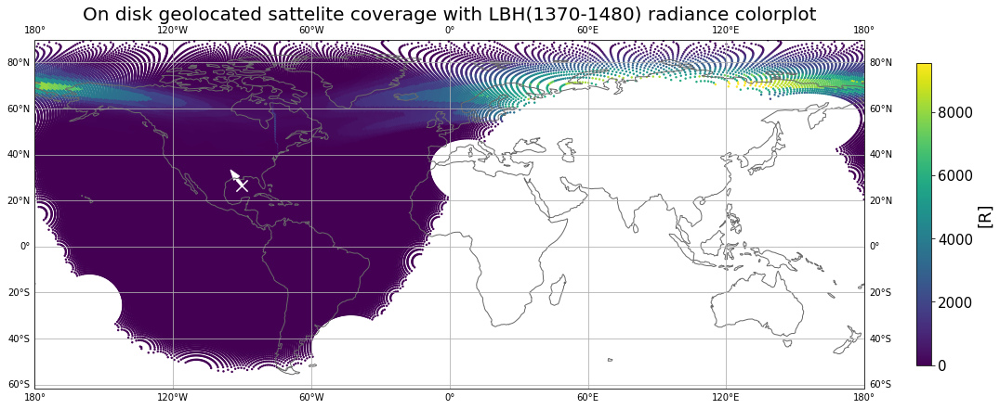

In [15]:
fig =plt.figure(figsize=[20,20])
ax = fig.add_subplot()
ax = plt.axes(projection=ccrs.PlateCarree())
cm = plt.cm.get_cmap('viridis')
z = np.array(dataondisk['LBH(1370-1480)'])

sc = plt.scatter(dataondisk['lon'],dataondisk['lat'],
              marker='o',s=2,  c=z, 
              norm = mpl.colors.Normalize(vmin=z.min(), vmax=z.max()),
              cmap=cm,transform=data_crs)
cb=plt.colorbar(sc,shrink=.30)
cb.set_label('[R]',size=18)
cb.ax.tick_params(labelsize=15)
ax.scatter(sat_lon,sat_lat, marker='x', s=150, c='w')
ax.arrow(sat_lon,sat_lat,(-90.2387-sat_lon)*1000,(26.7407-sat_lat)*1000,color='w',width=1)
ax.coastlines(color='dimgrey')
ax.gridlines(draw_labels=True)
plt.title('On disk geolocated sattelite coverage with LBH(1370-1480) radiance colorplot', fontsize=20)
plt.show()

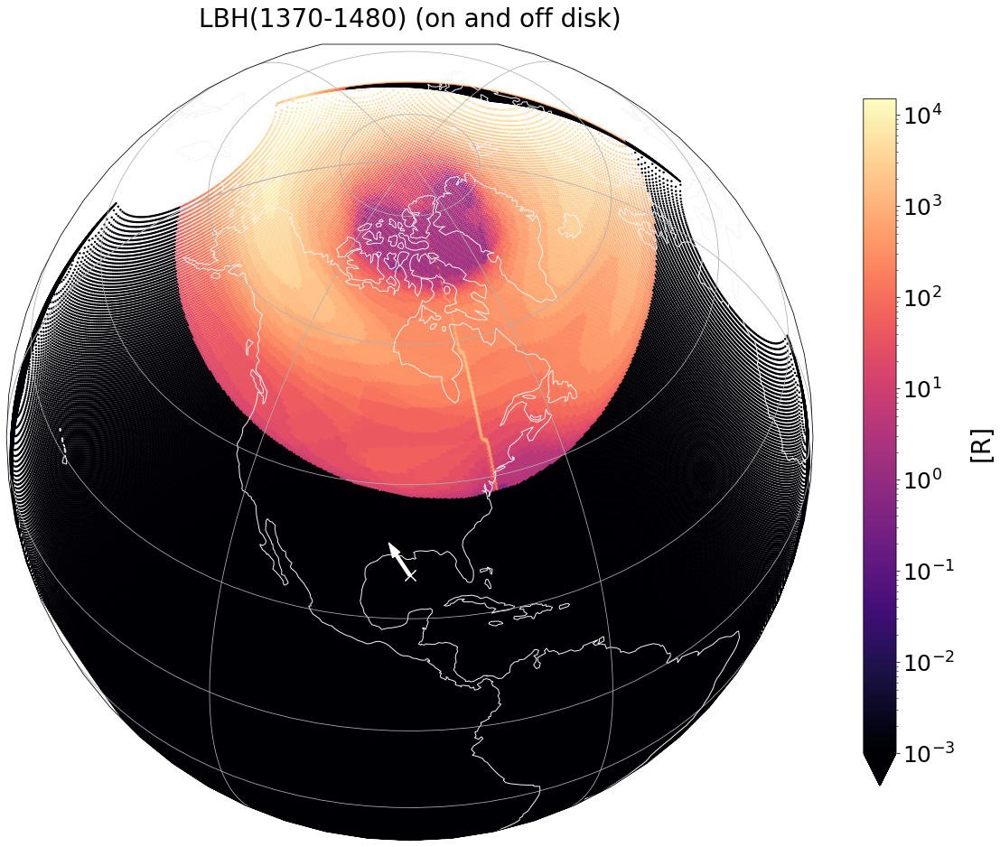

In [16]:
fig =plt.figure(figsize=[20, 20])

#ax = fig.add_subplot()

data_crs = ccrs.PlateCarree()
globe = ccrs.Geocentric()
ax = fig.add_subplot(projection=ccrs.Orthographic(sat_lon,sat_lat+20))
#ax.add_feature(cartopy.feature.OCEAN, zorder=0)




height = np.array(data['LBH(1370-1480)'])
height[height == 0.0] = 1.e-40


cm = plt.cm.get_cmap('magma')

im=plt.scatter(data['lon'],data['lat'],
             marker='o',s=2, 
             c=height, 
             norm = mpl.colors.LogNorm(vmin=0.001, vmax=height.max()),
              cmap=cm,transform=data_crs)


cb=plt.colorbar(im,shrink=.70,extend='min')
cb.set_label('[R]',size=28,labelpad=15)
cb.ax.tick_params(labelsize=25)

ax.set_title('LBH(1370-1480) (on and off disk)',size=28,pad=20)
ax.scatter(sat_lon,sat_lat, marker='x', s=150, c='w',transform=data_crs)
ax.arrow(sat_lon,sat_lat,(-90.2387-sat_lon)*1000,(26.7407-sat_lat)*1000,color='w',width=0.5,transform=data_crs)

#ax.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='black',linewidth=0.8)
ax.coastlines(color='whitesmoke')
ax.gridlines()


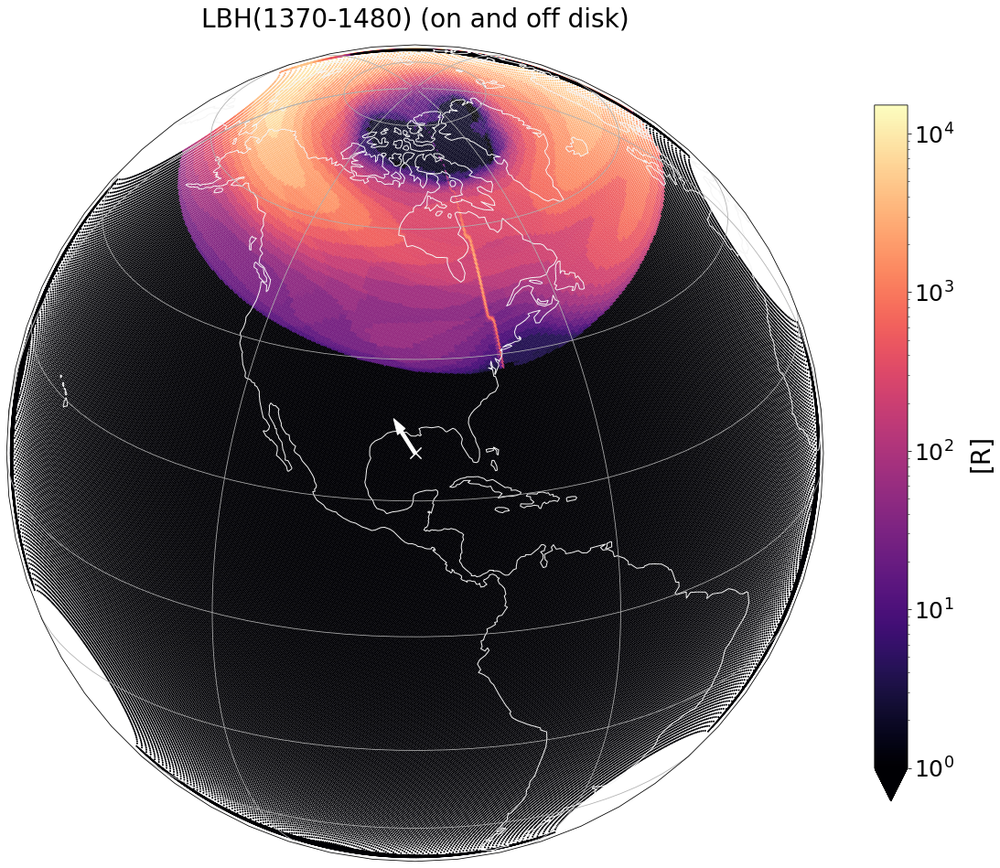

In [51]:
fig =plt.figure(figsize=[20, 20])

#ax = fig.add_subplot()

data_crs = ccrs.PlateCarree()
globe = ccrs.Geocentric()
ax = fig.add_subplot(projection=ccrs.Orthographic(sat_lon,sat_lat))
#ax.add_feature(cartopy.feature.OCEAN, zorder=0)




height = np.array(data['LBH(1370-1480)'])
height[height == 0.0] = 1.e-40


cm = plt.cm.get_cmap('magma')

im=plt.scatter(data['lon'],data['lat'],
             marker='o',s=1, 
             c=height, 
             norm = mpl.colors.LogNorm(vmin=1., vmax=height.max()),
              cmap=cm,transform=data_crs)


cb=plt.colorbar(im,shrink=.70,extend='min')
cb.set_label('[R]',size=28,labelpad=15)
cb.ax.tick_params(labelsize=25)

ax.set_title('LBH(1370-1480) (on and off disk)',size=28,pad=20)
ax.scatter(sat_lon,sat_lat, marker='x', s=150, c='w',transform=data_crs)
ax.arrow(sat_lon,sat_lat,(-90.2387-sat_lon)*1000,(26.7407-sat_lat)*1000,color='w',width=0.5,transform=data_crs)

#ax.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='black',linewidth=0.8)
ax.coastlines(color='whitesmoke')
ax.gridlines()



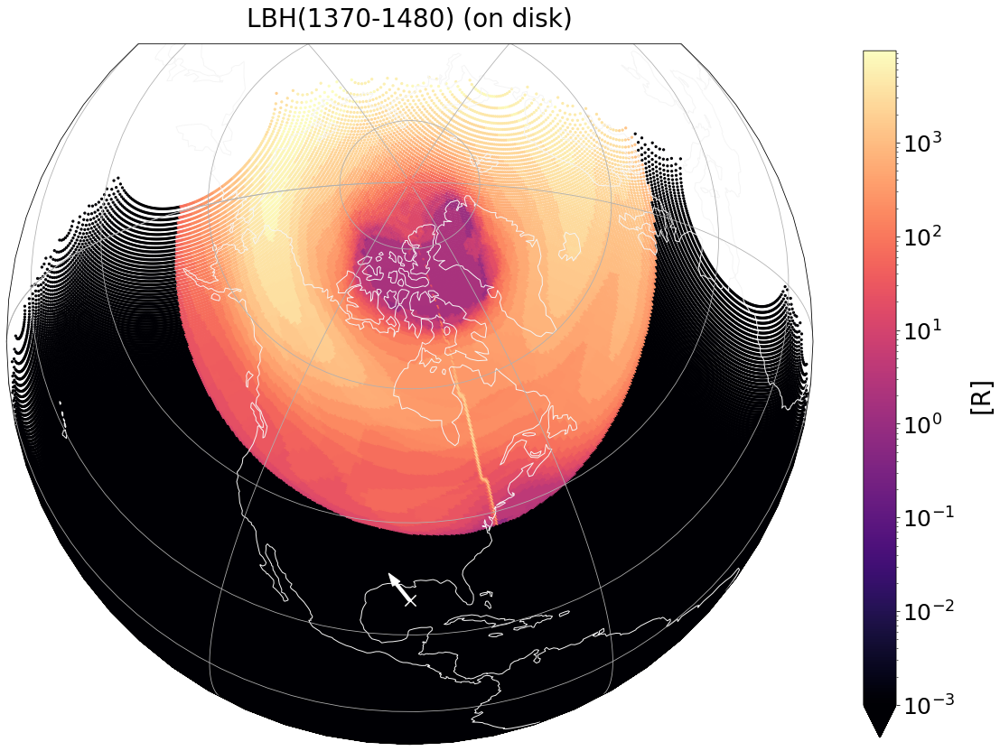

In [18]:
fig =plt.figure(figsize=[20, 20], )

#ax = fig.add_subplot()

data_crs = ccrs.PlateCarree()
globe = ccrs.Geocentric()
ax = fig.add_subplot(projection=ccrs.Orthographic(sat_lon,sat_lat+40))
#ax.add_feature(cartopy.feature.OCEAN, zorder=0)




height = np.array(dataondisk['LBH(1370-1480)'])
height[height == 0.0] = 1.e-40


cm = plt.cm.get_cmap('magma')

im=plt.scatter(dataondisk['lon'],dataondisk['lat'],
             marker='o',s=5, 
             c=height, 
             norm = mpl.colors.LogNorm(vmin=0.001, vmax=height.max()),
              cmap=cm,transform=data_crs)


cb=plt.colorbar(im,shrink=.70,extend='min')
cb.set_label('[R]',size=28,labelpad=15)
cb.ax.tick_params(labelsize=25)

ax.set_title('LBH(1370-1480) (on disk)',size=28,pad=20)
ax.scatter(sat_lon,sat_lat, marker='x', s=150, c='white',transform=data_crs)
ax.arrow(sat_lon,sat_lat,(-90.2387-sat_lon)*1000,(26.7407-sat_lat)*1000,color='w',width=0.5,transform=data_crs)

#ax.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='black',linewidth=0.8)
ax.coastlines(color='whitesmoke')

ax.gridlines()


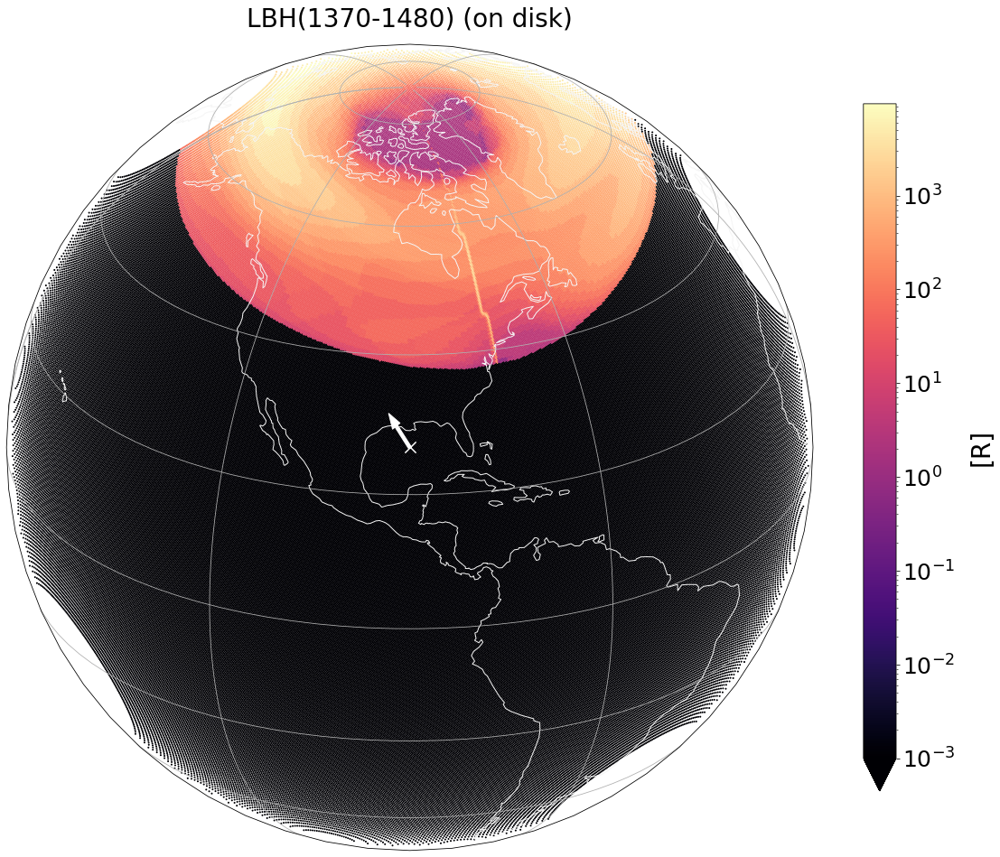

In [45]:
fig =plt.figure(figsize=[20, 20], )

#ax = fig.add_subplot()

data_crs = ccrs.PlateCarree()
globe = ccrs.Geocentric()
ax = fig.add_subplot(projection=ccrs.Orthographic(sat_lon,sat_lat))
#ax.add_feature(cartopy.feature.OCEAN, zorder=0)




height = np.array(dataondisk['LBH(1370-1480)'])
height[height == 0.0] = 1.e-40


cm = plt.cm.get_cmap('magma')

im=plt.scatter(dataondisk['lon'],dataondisk['lat'],
             marker='o',s=1, 
             c=height, 
             norm = mpl.colors.LogNorm(vmin=0.001, vmax=height.max()),
              cmap=cm,transform=data_crs)


cb=plt.colorbar(im,shrink=.70,extend='min')
cb.set_label('[R]',size=28,labelpad=15)
cb.ax.tick_params(labelsize=25)

ax.set_title('LBH(1370-1480) (on disk)',size=28,pad=20)
ax.scatter(sat_lon,sat_lat, marker='x', s=150, c='w',transform=data_crs)
ax.arrow(sat_lon,sat_lat,(-90.2387-sat_lon)*1000,(26.7407-sat_lat)*1000,color='w',width=0.5,transform=data_crs)

#ax.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='black',linewidth=0.8)
ax.coastlines(color='whitesmoke')

ax.gridlines()


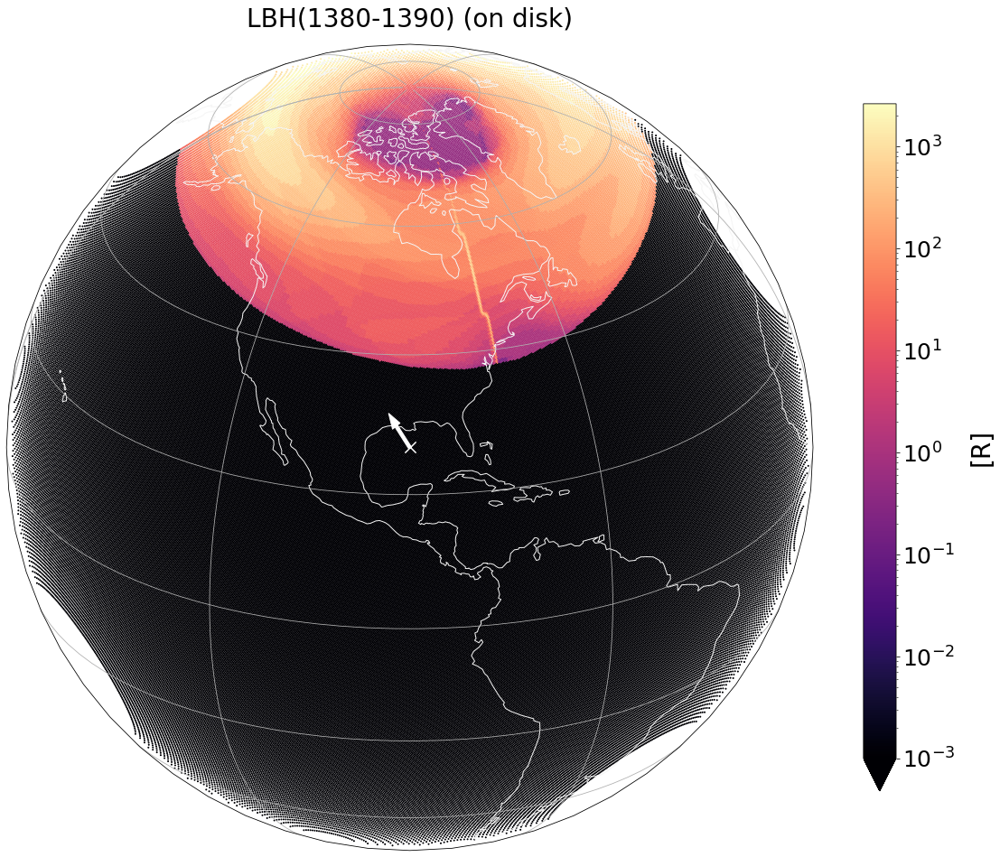

In [20]:
fig =plt.figure(figsize=[20, 20], )


data_crs = ccrs.PlateCarree()
globe = ccrs.Geocentric()
ax = fig.add_subplot(projection=ccrs.Orthographic(sat_lon,sat_lat))
#ax.add_feature(cartopy.feature.OCEAN, zorder=0)




height = np.array(dataondisk['LBH(1380-1390)'])
height[height == 0.0] = 1.e-40


cm = plt.cm.get_cmap('magma')

im=plt.scatter(dataondisk['lon'],dataondisk['lat'],
             marker='o',s=1, 
             c=height, 
             norm = mpl.colors.LogNorm(vmin=0.001, vmax=height.max()),
              cmap=cm,transform=data_crs)


cb=plt.colorbar(im,shrink=.70,extend='min')
cb.set_label('[R]',size=28,labelpad=15)
cb.ax.tick_params(labelsize=25)

ax.set_title('LBH(1380-1390) (on disk)',size=28,pad=20)
ax.scatter(sat_lon,sat_lat, marker='x', s=150, c='w',transform=data_crs)
ax.arrow(sat_lon,sat_lat,(-90.2387-sat_lon)*1000,(26.7407-sat_lat)*1000,color='w',width=0.5,transform=data_crs)

#ax.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='black',linewidth=0.8)
ax.coastlines(color='whitesmoke')

ax.gridlines()


(512, 512)


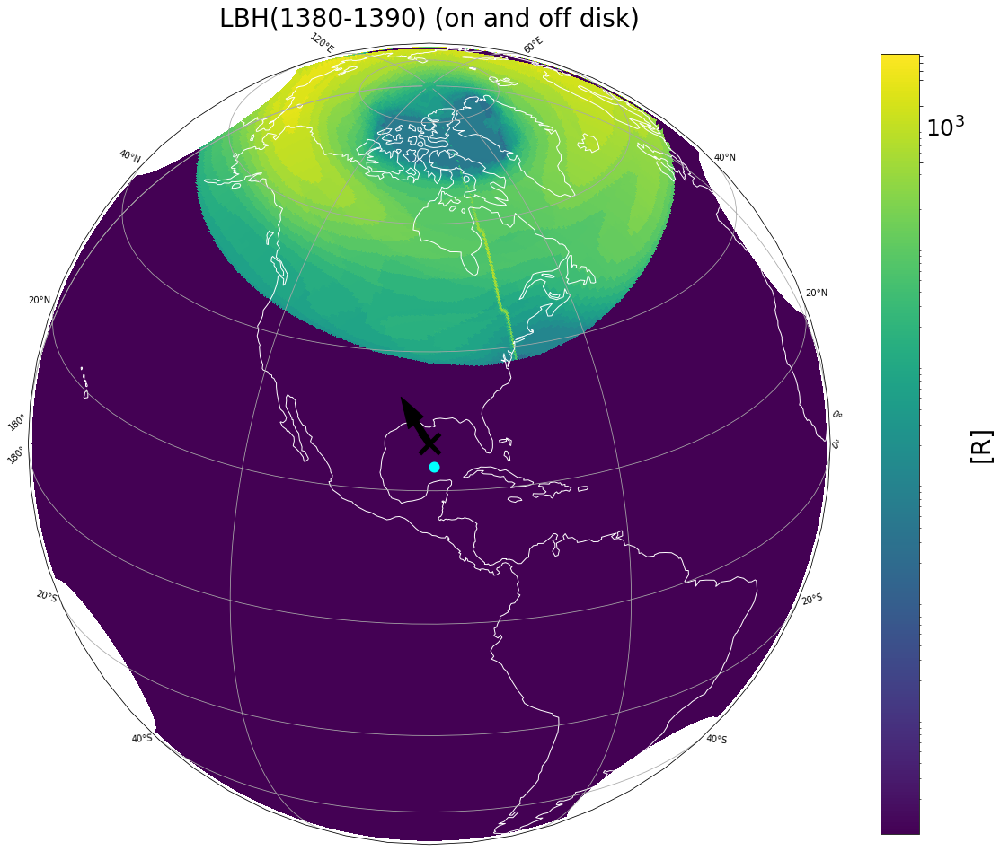

In [21]:
n1=512
n2=512
XX = np.array(data.lon)
XX=np.reshape(XX,(n1,n2))
YY = np.array(data.lat)
YY=np.reshape(YY,(n1,n2))
ZZ = np.array(data['LBH(1380-1390)'])
ZZ=np.reshape(ZZ,(n1,n2))
ZZ[ZZ == 0.0] = 1.e-40
print(np.shape(ZZ))

fig =plt.figure(figsize=[20, 20])
globe = ccrs.Geocentric()
ax = fig.add_subplot(projection=ccrs.Orthographic(sat_lon,sat_lat))
    #im=ax.imshow(z,extent=[x.min(), x.max(), y.min(), y.max()],aspect=0.03)
im=ax.pcolormesh(XX,YY,ZZ ,norm=mpl.colors.LogNorm(vmin=0.001, vmax=ZZ.max()),transform=data_crs)
cb1=fig.colorbar(im, shrink=.8)
ax.coastlines(color='w')
ax.gridlines(draw_labels=True,color='darkgray')
ax.scatter(sat_lon,sat_lat,color='k',marker='x', s=500,linewidth=5,transform=data_crs)
ax.scatter(lon_subsol, lat_subsol, color='cyan', marker='o', s=50, linewidth=5,transform=data_crs)
ax.set_title('Solar Zenith Angle',size=28)

cb1.set_label('[R]',size=28)
cb1.ax.tick_params(labelsize=25)
tick_locator = ticker.MaxNLocator(nbins=10)
cb1.locator = tick_locator
ax.set_title('LBH(1380-1390) (on and off disk)',size=28)
cb1.update_ticks()
#ax.scatter(lon_imax, lat_imax, color='pink', marker='o', s=500, linewidth=5,transform=data_crs)
origin = [sat_lon], [sat_lat]
ax.arrow(sat_lon,sat_lat,(-90.2387-sat_lon)*1000,(26.7407-sat_lat)*1000,color='k',width=1,transform=data_crs)

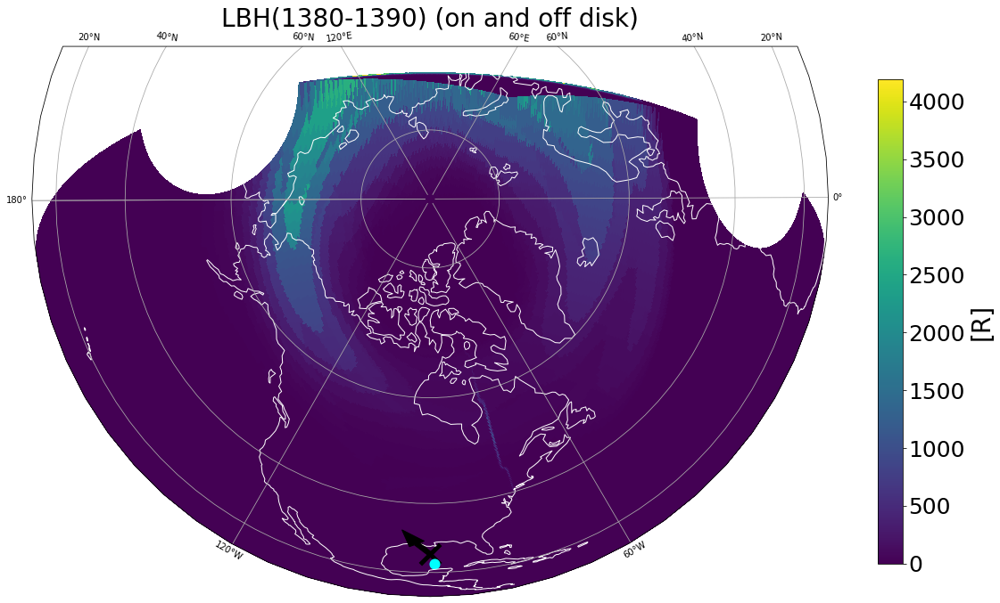

In [22]:
fig =plt.figure(figsize=[20, 20])
globe = ccrs.Geocentric()
ax = fig.add_subplot(projection=ccrs.Orthographic(sat_lon,90))
    #im=ax.imshow(z,extent=[x.min(), x.max(), y.min(), y.max()],aspect=0.03)
im=ax.pcolormesh(XX,YY,ZZ ,norm=mpl.colors.Normalize(vmin=ZZ.min(), vmax=ZZ.max()),transform=data_crs)
cb1=fig.colorbar(im, shrink=.5)
ax.coastlines(color='w')
ax.gridlines(draw_labels=True,color='darkgray')
ax.scatter(sat_lon,sat_lat,color='k',marker='x', s=500,linewidth=5,transform=data_crs)
ax.scatter(lon_subsol, lat_subsol, color='cyan', marker='o', s=50, linewidth=5,transform=data_crs)
ax.set_title('Solar Zenith Angle',size=28)

cb1.set_label('[R]',size=28)
cb1.ax.tick_params(labelsize=25)
tick_locator = ticker.MaxNLocator(nbins=10)
cb1.locator = tick_locator
ax.set_title('LBH(1380-1390) (on and off disk)',size=28)
cb1.update_ticks()
#ax.scatter(lon_imax, lat_imax, color='pink', marker='o', s=500, linewidth=5,transform=data_crs)
origin = [sat_lon], [sat_lat]
ax.arrow(sat_lon,sat_lat,(-90.2387-sat_lon)*1000,(26.7407-sat_lat)*1000,color='k',width=1,transform=data_crs)

### N2 LBH: 1400-1490

In [23]:
print(max(data['N2 LBH']),min(data['N2 LBH']))

10500.0 0.0


In [24]:
print('maximum value N2 LBH:',max(data['N2 LBH']))
imax = data['N2 LBH'].argmax()
print('location of max:',imax)
lat_imax=data['lat'][imax]
lon_imax=data['lon'][imax]
print('lat of max:',lat_imax)
print('lon of max:',lon_imax)
data_subpolar = data[data['sza']<2.]
data_subpolar.head()
# iss=np.where((data['sza'] < 2))
# issl=iss[0][0]#(data['lat'])[iss]
# issr=iss[0][-1]
# print(iss)
#print(data_subpolar.sza)
# print(issl,issr)
lat_subpol=data_subpolar['lat'].mean()
lon_subpol=data_subpolar['lon'].mean()
print('mean lat of subsolar region:',lat_subpol)
print('mean lon of subsolar region:',lon_subpol)
print('maximum value N2 LBH in subsolar region:',max(data_subpolar['N2 LBH']))
meanRad_subsol=data_subpolar['N2 LBH'].mean()
print('mean radiance of subsolar region:',meanRad_subsol)

data_subsatelite=data[((abs(data['lat']-sat_lat)<2) & (abs(data['lon']-(sat_lon))<2))]
#data_subsatelite.head(50)
print('mean lat of subsatelie region:',data_subsatelite['lat'].mean())
print('mean lon of subsatelite region:',data_subsatelite['lon'].mean())
print('maximum value N2 LBH in subsatelite region:',max(data_subsatelite['N2 LBH']))
meanRad_subsat=data_subsatelite['N2 LBH'].mean()
print('mean radiance of subsolar region:',meanRad_subsat)

meanRad_overall=data['N2 LBH'].mean()
print('overall mean radiance:',meanRad_overall)

maximum value N2 LBH: 10500.0
location of max: 182262
lat of max: 68.68434143
lon of max: 121.9042511
mean lat of subsolar region: 23.409910052492997
mean lon of subsolar region: -89.4942817582633
maximum value N2 LBH in subsolar region: 0.0
mean radiance of subsolar region: 0.0
mean lat of subsatelie region: 26.73032424968137
mean lon of subsatelite region: -90.24126905561275
maximum value N2 LBH in subsatelite region: 0.0
mean radiance of subsolar region: 0.0
overall mean radiance: 118.09001892852781


(512, 512)


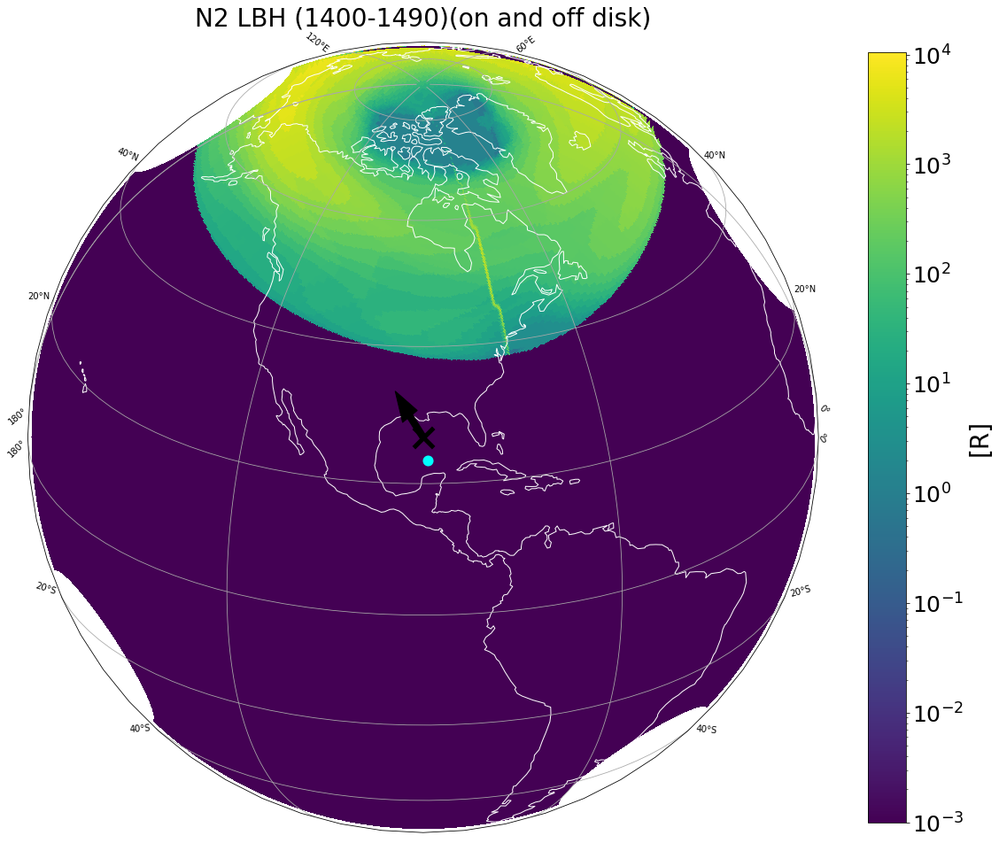

In [25]:
n1=512
n2=512
XX = np.array(data.lon)
XX=np.reshape(XX,(n1,n2))
YY = np.array(data.lat)
YY=np.reshape(YY,(n1,n2))
ZZ = np.array(data['N2 LBH'])
ZZ=np.reshape(ZZ,(n1,n2))
ZZ[ZZ == 0.0] = 1.e-40
print(np.shape(ZZ))
fig =plt.figure(figsize=[20, 20])
globe = ccrs.Geocentric()
ax = fig.add_subplot(projection=ccrs.Orthographic(sat_lon,sat_lat))
    #im=ax.imshow(z,extent=[x.min(), x.max(), y.min(), y.max()],aspect=0.03)
im=ax.pcolormesh(XX,YY,ZZ ,norm=mpl.colors.LogNorm(vmin=0.001, vmax=ZZ.max()),transform=data_crs)
cb1=fig.colorbar(im, shrink=.8)
ax.coastlines(color='w')
ax.gridlines(draw_labels=True,color='darkgray')
ax.scatter(sat_lon,sat_lat,color='k',marker='x', s=500,linewidth=5,transform=data_crs)
ax.scatter(lon_subpol, lat_subpol, color='cyan', marker='o', s=50, linewidth=5,transform=data_crs)
ax.set_title('Solar Zenith Angle',size=28)

cb1.set_label('[R]',size=28)
cb1.ax.tick_params(labelsize=25)
#tick_locator = ticker.MaxNLocator(nbins=10)
#cb1.locator = tick_locator
ax.set_title('N2 LBH (1400-1490)(on and off disk)',size=28)
#cb1.update_ticks()
#ax.scatter(lon_imax, lat_imax, color='pink', marker='o', s=500, linewidth=5,transform=data_crs)
origin = [sat_lon], [sat_lat]
ax.arrow(sat_lon,sat_lat,(-90.2387-sat_lon)*1000,(26.7407-sat_lat)*1000,color='k',width=1,transform=data_crs)

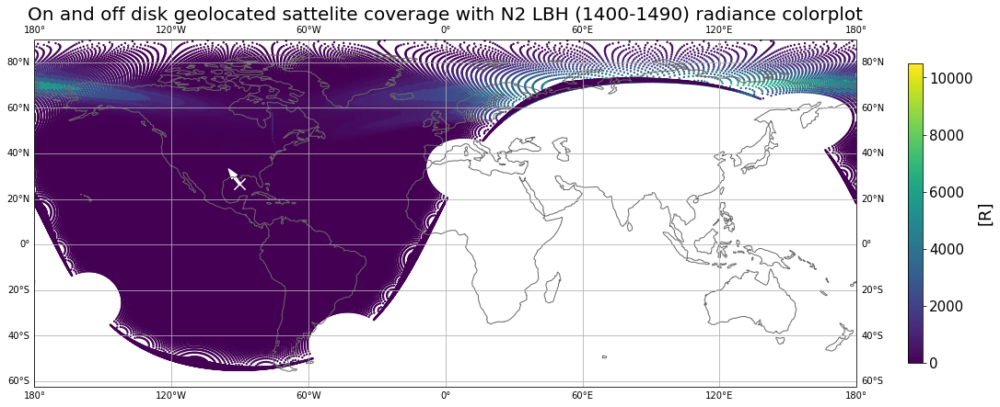

In [26]:
fig =plt.figure(figsize=[20,20])
ax = fig.add_subplot()
ax = plt.axes(projection=ccrs.PlateCarree())
cm = plt.cm.get_cmap('viridis')
z = np.array(data['N2 LBH'])

sc = plt.scatter(data['lon'],data['lat'],
              marker='o',s=2,  c=z, 
              norm = mpl.colors.Normalize(vmin=z.min(), vmax=z.max()),
              cmap=cm,transform=data_crs)
cb=plt.colorbar(sc,shrink=.30)
cb.set_label('[R]',size=18)
cb.ax.tick_params(labelsize=15)
ax.scatter(sat_lon,sat_lat, marker='x', s=150, c='w')
ax.arrow(sat_lon,sat_lat,(-90.2387-sat_lon)*1000,(26.7407-sat_lat)*1000,color='w',width=1)
ax.coastlines(color='dimgrey')
ax.gridlines(draw_labels=True)
plt.title('On and off disk geolocated sattelite coverage with N2 LBH (1400-1490) radiance colorplot', fontsize=20)
plt.show()

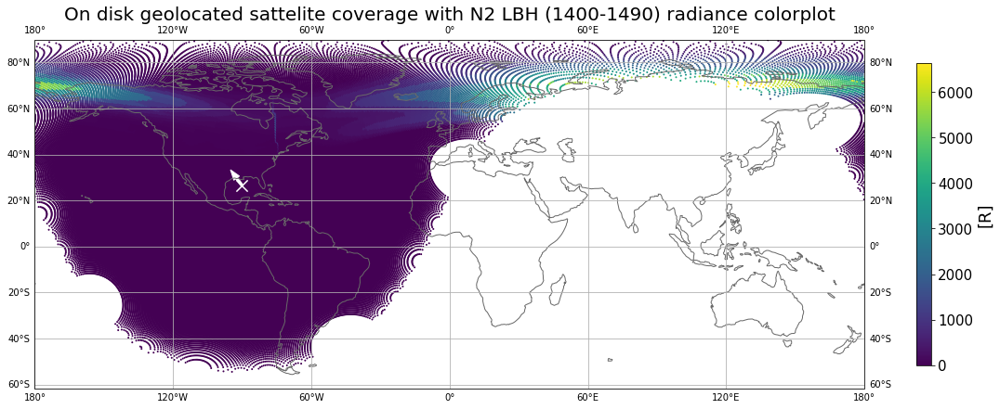

In [27]:
fig =plt.figure(figsize=[20,20])
ax = fig.add_subplot()
ax = plt.axes(projection=ccrs.PlateCarree())
cm = plt.cm.get_cmap('viridis')
z = np.array(dataondisk['N2 LBH'])

sc = plt.scatter(dataondisk['lon'],dataondisk['lat'],
              marker='o',s=1,  c=z, 
              norm = mpl.colors.Normalize(vmin=z.min(), vmax=z.max()),
              cmap=cm,transform=data_crs)
cb=plt.colorbar(sc,shrink=.30)
cb.set_label('[R]',size=18)
cb.ax.tick_params(labelsize=15)
ax.scatter(sat_lon,sat_lat, marker='x', s=150, c='w')
ax.arrow(sat_lon,sat_lat,(-90.2387-sat_lon)*1000,(26.7407-sat_lat)*1000,color='w',width=1)
ax.coastlines(color='dimgrey')
ax.gridlines(draw_labels=True)
plt.title('On disk geolocated sattelite coverage with N2 LBH (1400-1490) radiance colorplot', fontsize=20)
plt.show()

(512, 512)


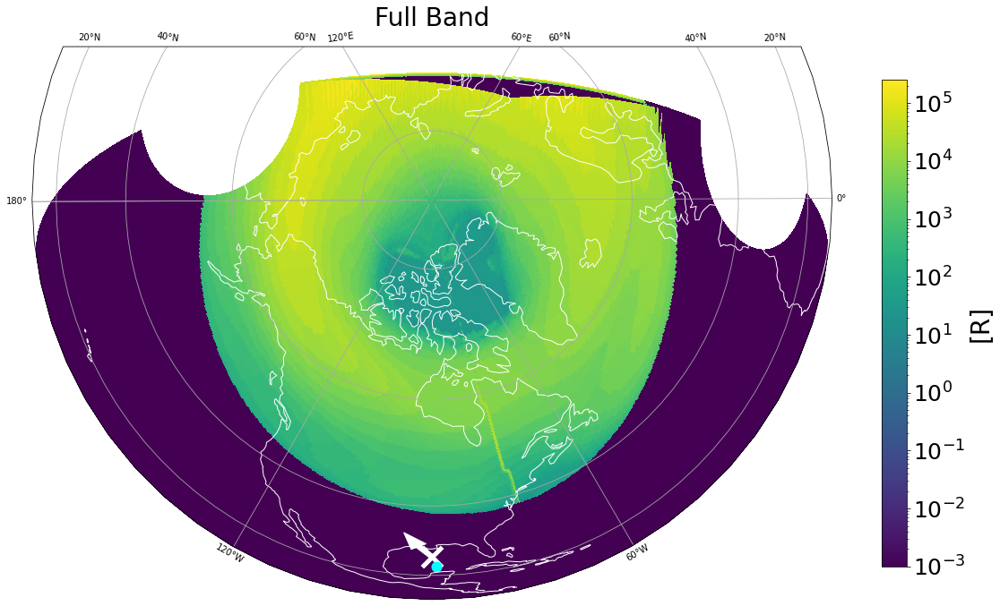

In [28]:
n1=512
n2=512
XX = np.array(data.lon)
XX=np.reshape(XX,(n1,n2))
YY = np.array(data.lat)
YY=np.reshape(YY,(n1,n2))
ZZ = np.array(data['full pass'])
ZZ=np.reshape(ZZ,(n1,n2))
ZZ[ZZ == 0.0] = 1.e-40
print(np.shape(ZZ))
fig =plt.figure(figsize=[20, 20])
globe = ccrs.Geocentric()
ax = fig.add_subplot(projection=ccrs.Orthographic(sat_lon,90))
    #im=ax.imshow(z,extent=[x.min(), x.max(), y.min(), y.max()],aspect=0.03)
im=ax.pcolormesh(XX,YY,ZZ ,norm=mpl.colors.LogNorm(vmin=0.001, vmax=ZZ.max()),transform=data_crs)
cb1=fig.colorbar(im, shrink=.5)
ax.coastlines(color='w')
ax.gridlines(draw_labels=True,color='darkgray')
ax.scatter(sat_lon,sat_lat,color='w',marker='x', s=500,linewidth=5,transform=data_crs)
ax.scatter(lon_subpol, lat_subpol, color='cyan', marker='o', s=50, linewidth=5,transform=data_crs)


cb1.set_label('[R]',size=28)
cb1.ax.tick_params(labelsize=25)
#tick_locator = ticker.MaxNLocator(nbins=10)
#cb1.locator = tick_locator
ax.set_title('Full Band',size=28)
#cb1.update_ticks()
#ax.scatter(lon_imax, lat_imax, color='pink', marker='o', s=500, linewidth=5,transform=data_crs)
origin = [sat_lon], [sat_lat]
ax.arrow(sat_lon,sat_lat,(-90.2387-sat_lon)*1000,(26.7407-sat_lat)*1000,color='w',width=1,transform=data_crs)

In [29]:
pd.set_option('display.max_rows', None)
print('maximum value LBH (1370-1480) A:',max(data['LBH(1370-1480)']))
imax = data['LBH(1370-1480)'].argmax()
print('location of max:',imax)
lat_imax=data['lat'][imax]
lon_imax=data['lon'][imax]
print('lat of max:',lat_imax)
print('lon of max:',lon_imax)
data_subpolar = data[data['sza']<2.]
data_subpolar.head()
# iss=np.where((data['sza'] < 2))
# issl=iss[0][0]#(data['lat'])[iss]
# issr=iss[0][-1]
# print(iss)
#print(data_subpolar.sza)
# print(issl,issr)
lat_subpol=data_subpolar['lat'].mean()
lon_subpol=data_subpolar['lon'].mean()
print('mean lat of subsolar region:',lat_subpol)
print('mean lon of subsolar region:',lon_subpol)
print('maximum value LBH (1370-1480) A in subsolar region:',max(data_subpolar['LBH(1370-1480)']))
meanRad_subpol=data_subpolar['LBH(1370-1480)'].mean()
print('mean radiance of subsolar region:',meanRad_subpol)

data_subsatelite=data[((abs(data['lat']-sat_lat)<2) & (abs(data['lon']-(sat_lon))<2))]
#data_subsatelite.head(50)
print('mean lat of sub-sattelie region:',data_subsatelite['lat'].mean())
print('mean lon of sub-sattelite region:',data_subsatelite['lon'].mean())
print('maximum value LBH(1370-1480) in sub-sattelite region:',max(data_subsatelite['LBH(1370-1480)']))
meanRad_subsat=data_subsatelite['LBH(1370-1480)'].mean()
print('mean radiance of subsattelite region:',meanRad_subsat)

maximum value LBH (1370-1480) A: 15100.0
location of max: 182262
lat of max: 68.68434143
lon of max: 121.9042511
mean lat of subsolar region: 23.409910052492997
mean lon of subsolar region: -89.4942817582633
maximum value LBH (1370-1480) A in subsolar region: 0.0
mean radiance of subsolar region: 0.0
mean lat of sub-sattelie region: 26.73032424968137
mean lon of sub-sattelite region: -90.24126905561275
maximum value LBH(1370-1480) in sub-sattelite region: 0.0
mean radiance of subsattelite region: 0.0


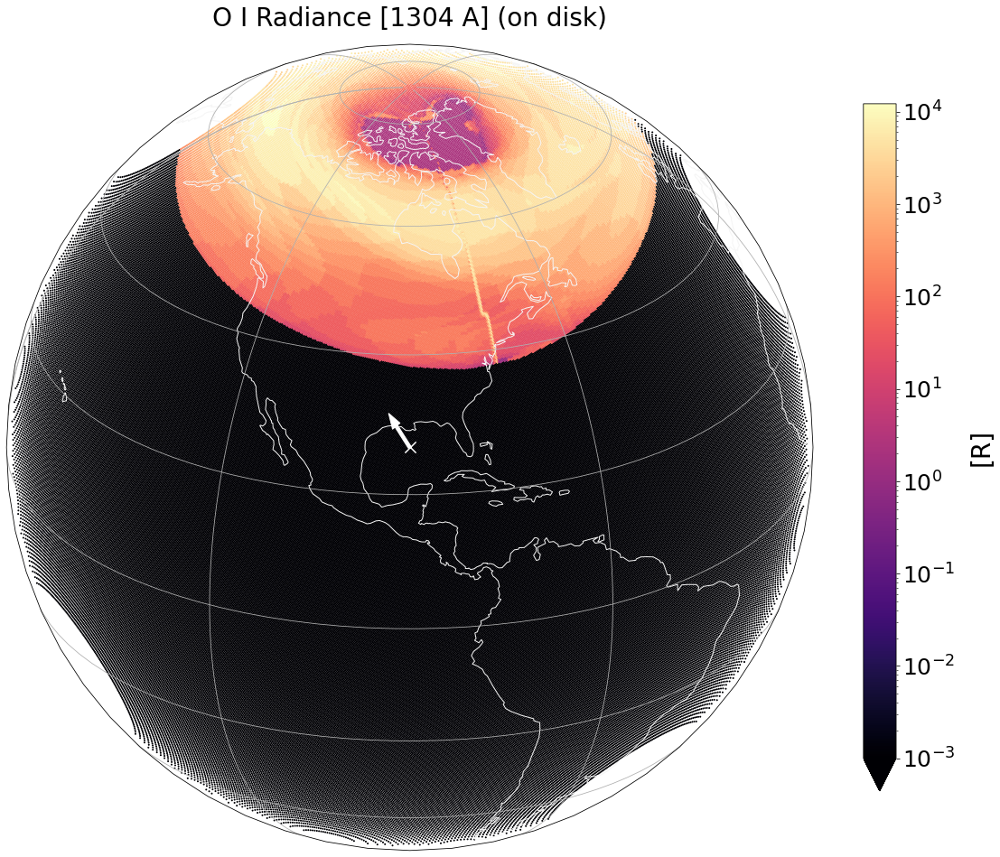

In [30]:
fig =plt.figure(figsize=[20, 20])

#ax = fig.add_subplot()

data_crs = ccrs.PlateCarree()
globe = ccrs.Geocentric()
ax = fig.add_subplot(projection=ccrs.Orthographic(sat_lon,sat_lat))
#ax.add_feature(cartopy.feature.OCEAN, zorder=0)




height = np.array(dataondisk['O I 1304 A'])
height[height == 0.0] = 1.e-40


cm = plt.cm.get_cmap('magma')

im=plt.scatter(dataondisk['lon'],dataondisk['lat'],
             marker='o',s=1, 
             c=height, 
             norm = mpl.colors.LogNorm(vmin=0.001, vmax=height.max()),
              cmap=cm,transform=data_crs)


cb=plt.colorbar(im,shrink=.70,extend='min')
cb.set_label('[R]',size=28,labelpad=15)
cb.ax.tick_params(labelsize=25)

ax.set_title('O I Radiance [1304 A] (on disk)',size=28,pad=20)
ax.scatter(sat_lon,sat_lat, marker='x', s=150, c='w',transform=data_crs)
ax.arrow(sat_lon,sat_lat,(-90.2387-sat_lon)*1000,(26.7407-sat_lat)*1000,color='w',width=0.5,transform=data_crs)

#ax.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='black',linewidth=0.8)
ax.coastlines(color='whitesmoke')
ax.set_global()
ax.gridlines()




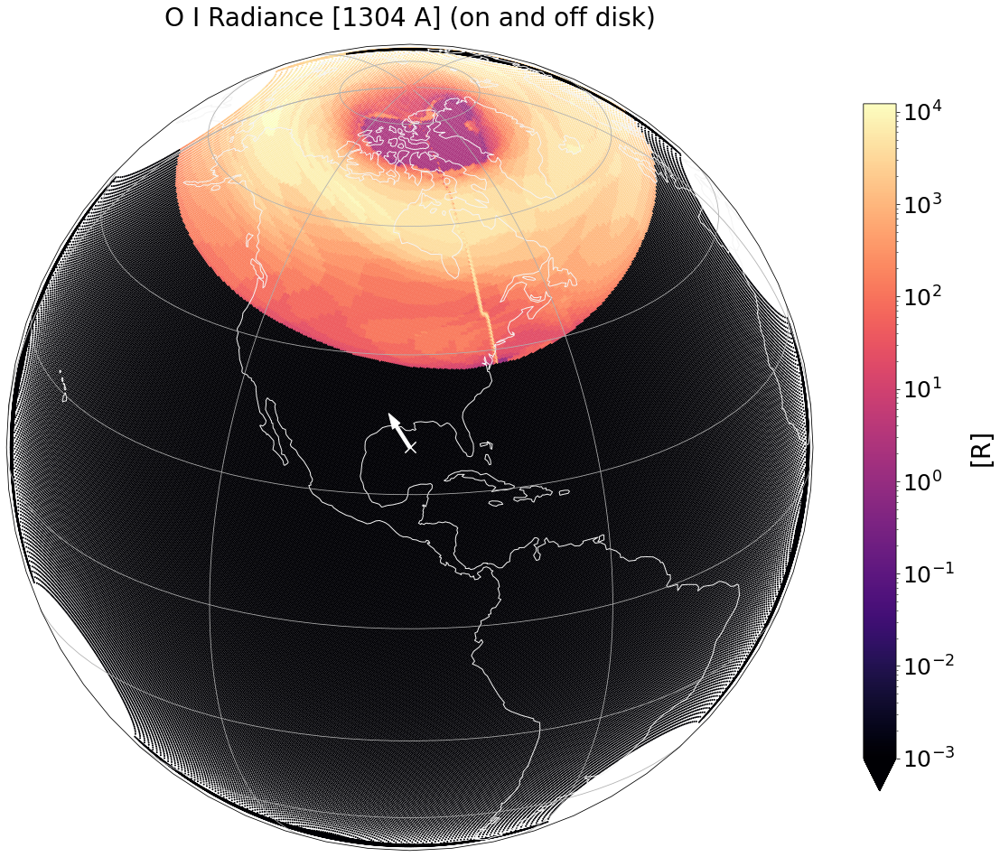

In [31]:
fig =plt.figure(figsize=[20, 20])

#ax = fig.add_subplot()

data_crs = ccrs.PlateCarree()
globe = ccrs.Geocentric()
ax = fig.add_subplot(projection=ccrs.Orthographic(sat_lon,sat_lat))
#ax.add_feature(cartopy.feature.OCEAN, zorder=0)




height = np.array(data['O I 1304 A'])
height[height == 0.0] = 1.e-40


cm = plt.cm.get_cmap('magma')

im=plt.scatter(data['lon'],data['lat'],
             marker='o',s=1, 
             c=height, 
             norm = mpl.colors.LogNorm(vmin=0.001, vmax=height.max()),
              cmap=cm,transform=data_crs)


cb=plt.colorbar(im,shrink=.70,extend='min')
cb.set_label('[R]',size=28,labelpad=15)
cb.ax.tick_params(labelsize=25)

ax.set_title('O I Radiance [1304 A] (on and off disk)',size=28,pad=20)
ax.scatter(sat_lon,sat_lat, marker='x', s=150, c='w',transform=data_crs)
ax.arrow(sat_lon,sat_lat,(-90.2387-sat_lon)*1000,(26.7407-sat_lat)*1000,color='w',width=0.5,transform=data_crs)

#ax.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='black',linewidth=0.8)
ax.coastlines(color='whitesmoke')
ax.set_global()
ax.gridlines()

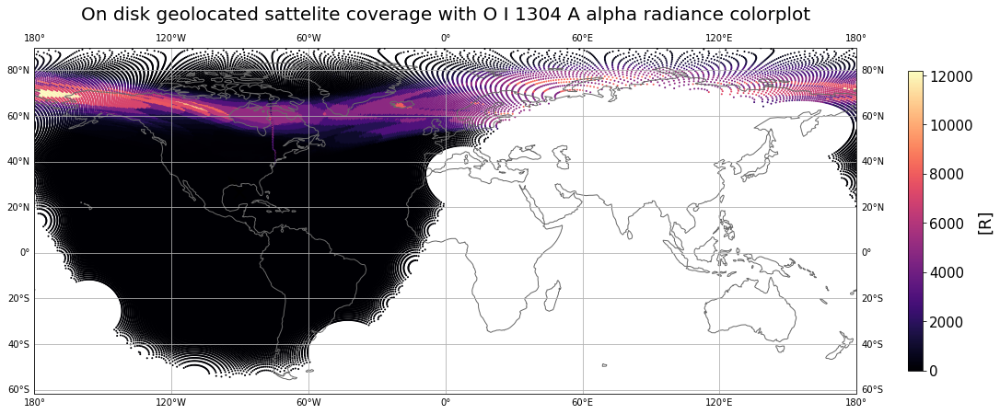

In [32]:
fig =plt.figure(figsize=[20,20])
ax = fig.add_subplot()
ax = plt.axes(projection=ccrs.PlateCarree())
cm = plt.cm.get_cmap('magma')
z = np.array(dataondisk['O I 1304 A'])

sc = plt.scatter(dataondisk['lon'],dataondisk['lat'],
              marker='o',s=1,  c=z, 
              norm = mpl.colors.Normalize(vmin=z.min(), vmax=z.max()),
              cmap=cm,transform=data_crs)
cb=plt.colorbar(sc,shrink=.30)
cb.set_label('[R]',size=18)
cb.ax.tick_params(labelsize=15)
ax.scatter(sat_lon,sat_lat, marker='x', s=150, c='k')
ax.arrow(sat_lon,sat_lat,(-90.2387-sat_lon)*1000,(26.7407-sat_lat)*1000,color='k',width=1)
ax.coastlines(color='dimgrey')
ax.gridlines(draw_labels=True)
plt.title('On disk geolocated sattelite coverage with O I 1304 A alpha radiance colorplot', fontsize=20,pad=15)
plt.show()

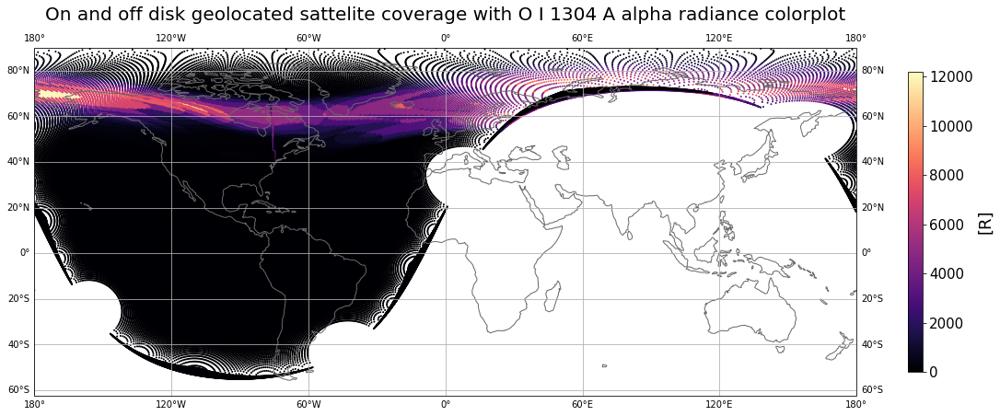

In [33]:
fig =plt.figure(figsize=[20,20])
ax = fig.add_subplot()
ax = plt.axes(projection=ccrs.PlateCarree())
cm = plt.cm.get_cmap('magma')
z = np.array(data['O I 1304 A'])

sc = plt.scatter(data['lon'],data['lat'],
              marker='o',s=1,  c=z, 
              norm = mpl.colors.Normalize(vmin=z.min(), vmax=z.max()),
              cmap=cm,transform=data_crs)
cb=plt.colorbar(sc,shrink=.30)
cb.set_label('[R]',size=18)
cb.ax.tick_params(labelsize=15)
ax.scatter(sat_lon,sat_lat, marker='x', s=150, c='k')
ax.arrow(sat_lon,sat_lat,(-90.2387-sat_lon)*1000,(26.7407-sat_lat)*1000,color='k',width=1)
ax.coastlines(color='dimgrey')
ax.gridlines(draw_labels=True)
plt.title('On and off disk geolocated sattelite coverage with O I 1304 A alpha radiance colorplot', fontsize=20,pad=15)
plt.show()

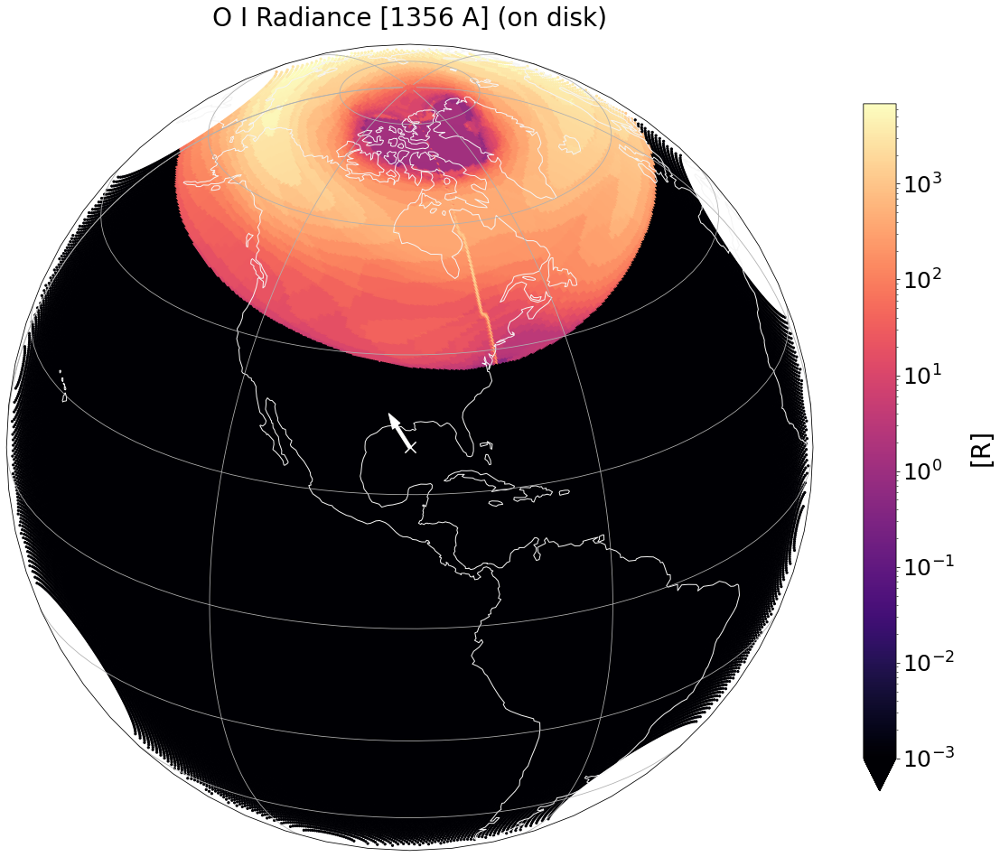

In [34]:
fig =plt.figure(figsize=[20, 20])

#ax = fig.add_subplot()

data_crs = ccrs.PlateCarree()
globe = ccrs.Geocentric()
ax = fig.add_subplot(projection=ccrs.Orthographic(sat_lon,sat_lat))
#ax.add_feature(cartopy.feature.OCEAN, zorder=0)




height = np.array(dataondisk['O I 1356 A'])
height[height == 0.0] = 1.e-40


cm = plt.cm.get_cmap('magma')

im=plt.scatter(dataondisk['lon'],dataondisk['lat'],
             marker='o',s=5, 
             c=height, 
             norm = mpl.colors.LogNorm(vmin=0.001, vmax=height.max()),
              cmap=cm,transform=data_crs)


cb=plt.colorbar(im,shrink=.70,extend='min')
cb.set_label('[R]',size=28,labelpad=15)
cb.ax.tick_params(labelsize=25)

ax.set_title('O I Radiance [1356 A] (on disk)',size=28,pad=20)
ax.scatter(sat_lon,sat_lat, marker='x', s=150, c='w',transform=data_crs)
ax.arrow(sat_lon,sat_lat,(-90.2387-sat_lon)*1000,(26.7407-sat_lat)*1000,color='w',width=0.5,transform=data_crs)

#ax.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='black',linewidth=0.8)
ax.coastlines(color='whitesmoke')
ax.set_global()
ax.gridlines()

In [35]:
max(dataondisk['O I 1356 A'])

6840.0

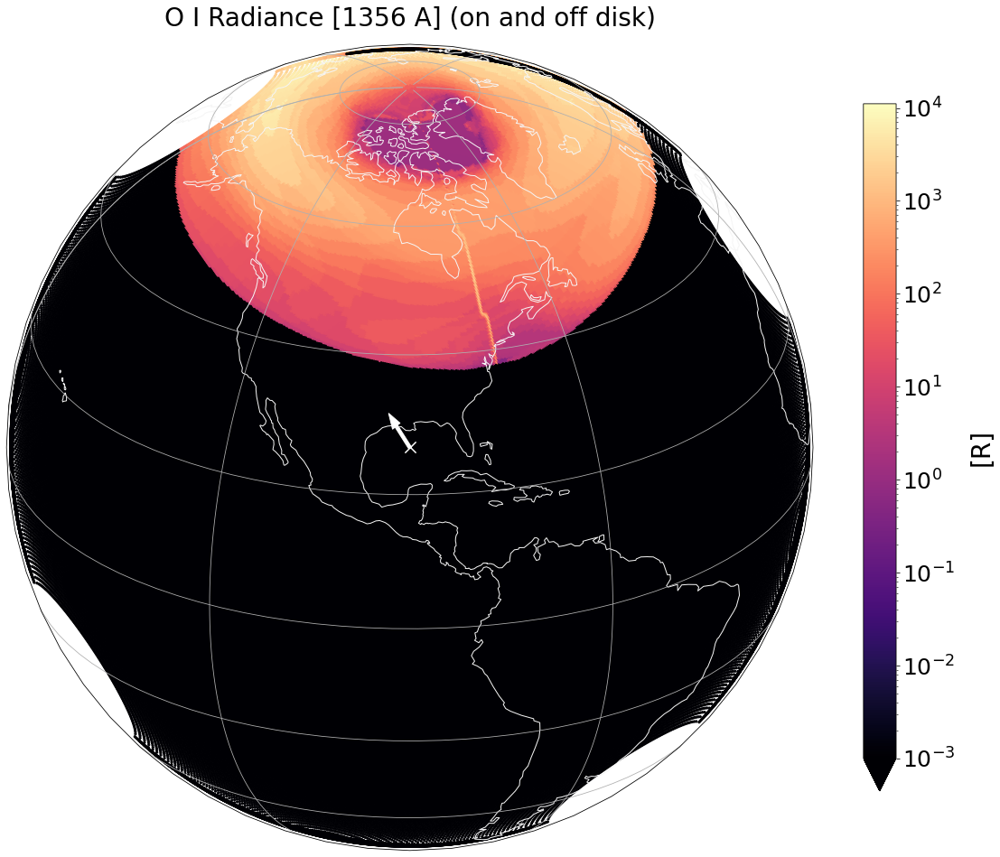

In [36]:
fig =plt.figure(figsize=[20, 20])

#ax = fig.add_subplot()

data_crs = ccrs.PlateCarree()
globe = ccrs.Geocentric()
ax = fig.add_subplot(projection=ccrs.Orthographic(sat_lon,sat_lat))
#ax.add_feature(cartopy.feature.OCEAN, zorder=0)




height = np.array(data['O I 1356 A'])
height[height == 0.0] = 1.e-40


cm = plt.cm.get_cmap('magma')

im=plt.scatter(data['lon'],data['lat'],
             marker='o',s=5, 
             c=height, 
             norm = mpl.colors.LogNorm(vmin=0.001, vmax=height.max()),
              cmap=cm,transform=data_crs)


cb=plt.colorbar(im,shrink=.70,extend='min')
cb.set_label('[R]',size=28,labelpad=15)
cb.ax.tick_params(labelsize=25)

ax.set_title('O I Radiance [1356 A] (on and off disk)',size=28,pad=20)
ax.scatter(sat_lon,sat_lat, marker='x', s=150, c='w',transform=data_crs)
ax.arrow(sat_lon,sat_lat,(-90.2387-sat_lon)*1000,(26.7407-sat_lat)*1000,color='w',width=0.5,transform=data_crs)

#ax.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='black',linewidth=0.8)
ax.coastlines(color='whitesmoke')
ax.set_global()
ax.gridlines()



In [37]:
max(data["O I 1641 A"])

343.0

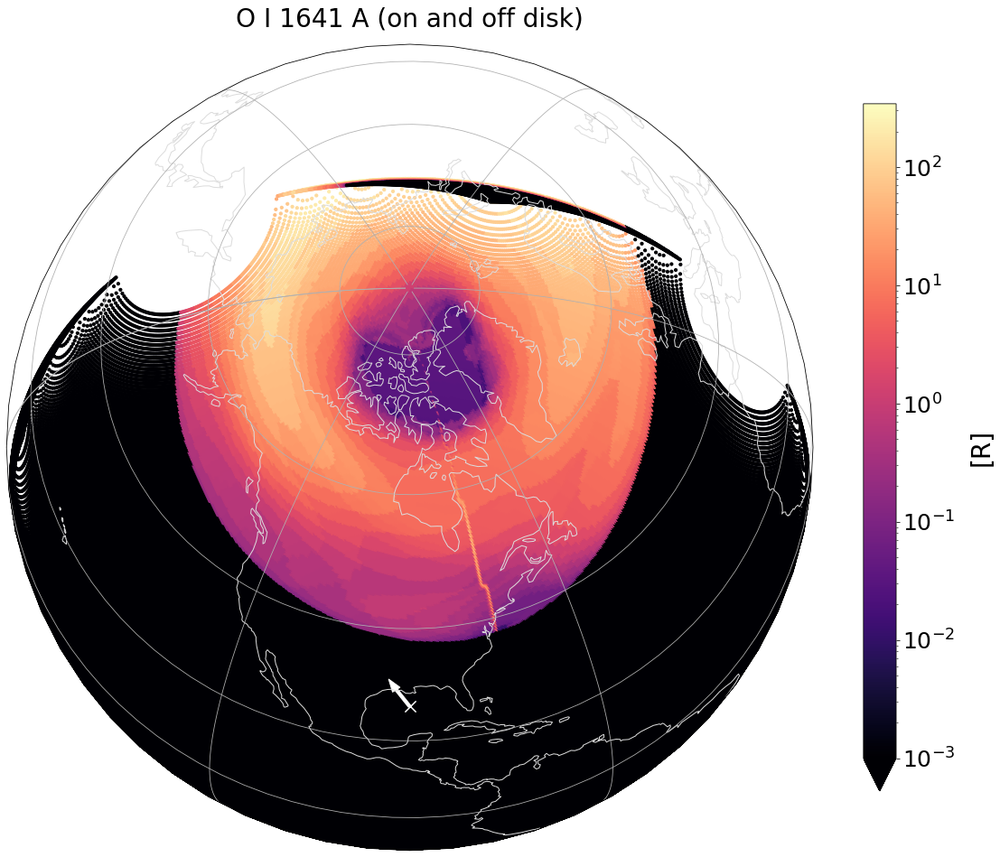

In [38]:
fig =plt.figure(figsize=[20, 20])

#ax = fig.add_subplot()

data_crs = ccrs.PlateCarree()
globe = ccrs.Geocentric()
ax = fig.add_subplot(projection=ccrs.Orthographic(sat_lon,sat_lat+40))
#ax.add_feature(cartopy.feature.OCEAN, zorder=0)




height = np.array(data['O I 1641 A'])
height[height == 0.0] = 1.e-40
#scaled_h = ( height - height.min()) / height.ptp()
colors = plt.cm.magma(height)


cm =  plt.cm.magma

im=plt.scatter(data['lon'],data['lat'],
             marker='o',s=10, c =height, 
             norm = mpl.colors.LogNorm(vmin=0.001, vmax=height.max()),
             cmap=cm,transform=data_crs)


cb=plt.colorbar(im,shrink=.70,extend='min')
cb.set_label('[R]',size=28,labelpad=15)
cb.ax.tick_params(labelsize=25)

ax.set_title('O I 1641 A (on and off disk)',size=28,pad=20)
ax.scatter(sat_lon,sat_lat, marker='x', s=150, c='w',transform=data_crs)
ax.arrow(sat_lon,sat_lat,(-90.2387-sat_lon)*1000,(26.7407-sat_lat)*1000,color='w',width=0.5,transform=data_crs)

#ax.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='black',linewidth=0.8)
ax.coastlines(color='gainsboro')
ax.set_global()
ax.gridlines()

In [39]:
dat_csx_satlon=data[abs(data["lon"]-sat_lon) <= 1]

Text(0, 0.5, 'Altitude')

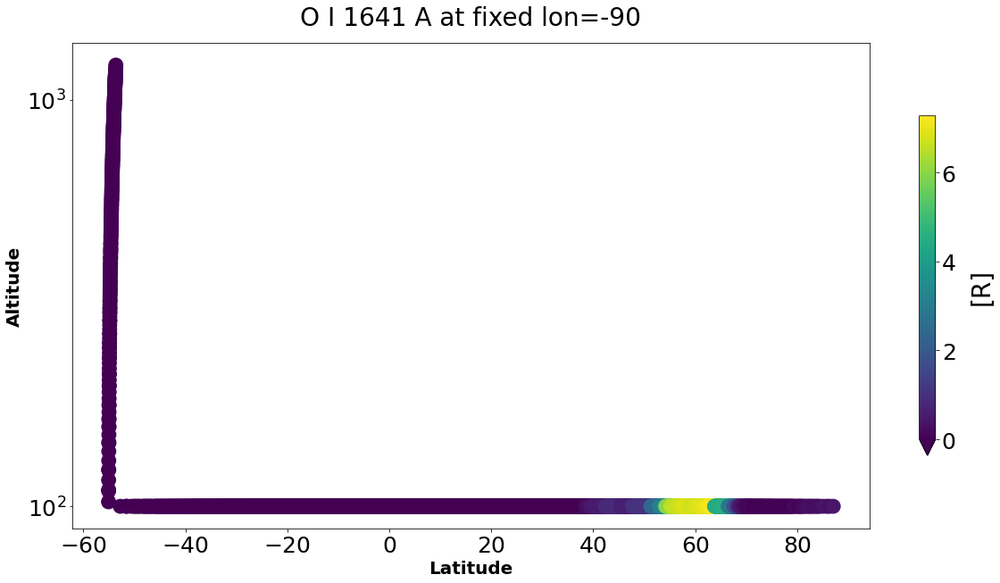

In [40]:
fig =plt.figure(figsize=[20, 10])

ax = fig.add_subplot()


height = np.array(dat_csx_satlon['O I 1641 A'])


cm = plt.cm.get_cmap('viridis')

im=ax.scatter(dat_csx_satlon['lat'],dat_csx_satlon['alt'],
             marker='o',s=250, 
             c=height, 
             norm = mpl.colors.Normalize(vmin=height.min(), vmax=height.max()),
             cmap=cm)


cb=plt.colorbar(im,shrink=.70,extend='min')
cb.set_label('[R]',size=28,labelpad=15)
cb.ax.tick_params(labelsize=25)

ax.set_title('O I 1641 A at fixed lon=-90',size=28,pad=20)
ax.set_yscale('symlog')
ax.tick_params(labelsize=25)
ax.set_xlabel('Latitude',fontweight='bold', fontsize = 20)
ax.set_ylabel('Altitude',fontweight='bold', fontsize = 20)

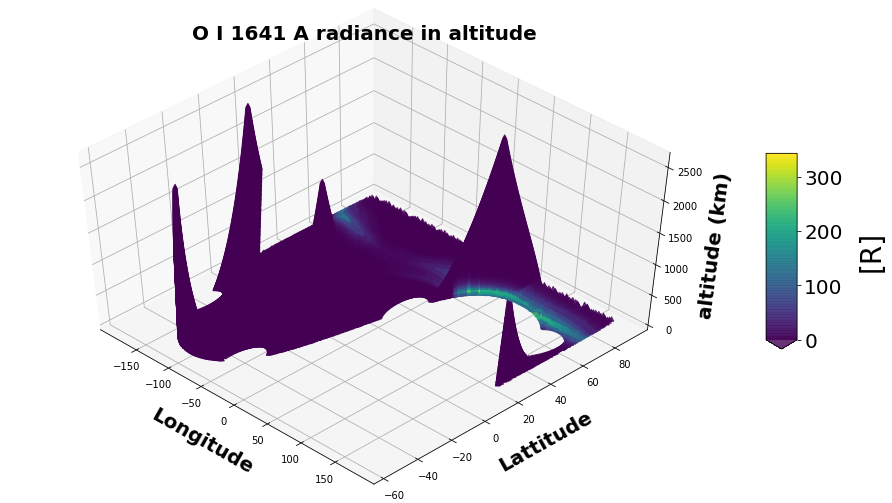

In [41]:
from mpl_toolkits import mplot3d 
# Creating figure 
fig = plt.figure(figsize = (16, 9)) 
ax = plt.axes(projection ="3d") 
    
# Add x, y gridlines  
ax.grid(b = True, color ='grey',  
        linestyle ='-.', linewidth = 0.3,  
        alpha = 0.2)  
  
  
# Creating color map 
my_cmap = plt.get_cmap('viridis') 
  
# Creating plot 
sctt = ax.scatter3D(data.lon, data.lat, data.alt, 
                    alpha = 0.8, 
                    c = data['O I 1641 A'],  
                    cmap = my_cmap,  
                    marker ='^') 
  
plt.title("O I 1641 A radiance in altitude",fontsize=20, fontweight='bold') 
ax.set_xlabel('Longitude', fontweight ='bold', fontsize=20,labelpad=15)  
ax.set_ylabel('Lattitude', fontweight ='bold', fontsize=20,labelpad=15)  
ax.set_zlabel('altitude (km)', fontweight ='bold', fontsize=20,labelpad=10) 
cb=fig.colorbar(sctt, ax = ax, shrink = 0.4, aspect = 6,extend='min') 
cb.set_label('[R]',size=28,labelpad=15)
cb.ax.tick_params(labelsize=20)

ax.view_init(50, -45)
# show plot 
plt.show() 

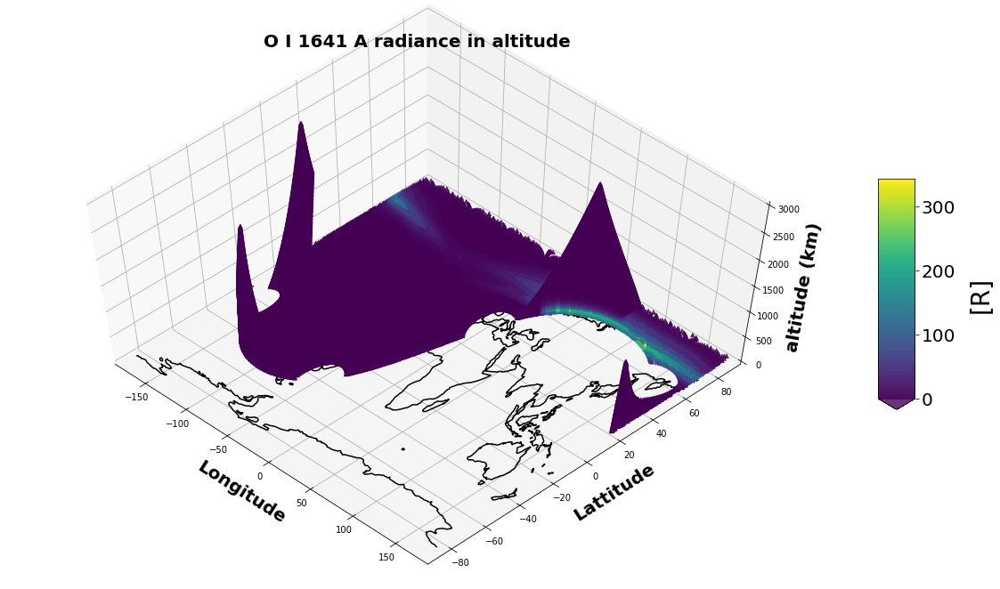

In [42]:
import itertools

from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
import numpy as np

import cartopy.feature
from cartopy.mpl.patch import geos_to_path
import cartopy.crs as ccrs
#ax = plt.axes(projection ="3d") 
    
# #Add x, y gridlines  
# ax.grid(b = True, color ='grey',  
#         linestyle ='-.', linewidth = 0.3,  
#         alpha = 0.2)  
  
fig = plt.figure(figsize = (16, 9))




ax = Axes3D(fig, xlim=[-180, 180], ylim=[-90, 90])
ax.set_zlim(bottom=0,top=3000)


target_projection = ccrs.PlateCarree()

feature = cartopy.feature.NaturalEarthFeature('physical', 'coastline', '110m')
geoms = feature.geometries()

geoms = [target_projection.project_geometry(geom, feature.crs)
         for geom in geoms]

paths = list(itertools.chain.from_iterable(geos_to_path(geom) for geom in geoms))

# At this point, we start working around mpl3d's slightly broken interfaces.
# So we produce a LineCollection rather than a PathCollection.
segments = []
for path in paths:
    vertices = [vertex for vertex, _ in path.iter_segments()]
    vertices = np.asarray(vertices)
    segments.append(vertices)

lc = LineCollection(segments, color='black')

ax.add_collection3d(lc)

ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
ax.set_zlabel('Altitude')

# Creating color map 
my_cmap = plt.get_cmap('viridis') 
  
# Creating plot 
sctt = ax.scatter3D(data.lon, data.lat, data.alt, 
                    alpha = 0.8, 
                    c = data['O I 1641 A'],  
                    cmap = my_cmap,  
                    marker ='^')
plt.title("O I 1641 A radiance in altitude",fontsize=20, fontweight='bold') 
ax.set_xlabel('Longitude', fontweight ='bold', fontsize=20,labelpad=15)  
ax.set_ylabel('Lattitude', fontweight ='bold', fontsize=20,labelpad=15)  
ax.set_zlabel('altitude (km)', fontweight ='bold', fontsize=20,labelpad=10) 
cb=fig.colorbar(sctt, ax = ax, shrink = 0.4, aspect = 6,extend='min') 
cb.set_label('[R]',size=28,labelpad=15)
cb.ax.tick_params(labelsize=20)

ax.view_init(60, -45)

plt.show()

# Making MLAT and MLT with AACGM-v2

In [43]:
import datetime
import aacgmv2
dobj = datetime.datetime(2024,6,21,18,tzinfo=datetime.timezone.utc) 

resetting environment variable IGRF_COEFFS in python script
resetting environment variable AACGM_v2_DAT_PREFIX in python script
non-default coefficient files may be specified by running aacgmv2.wrapper.set_coeff_path before any other functions


In [44]:
# geo to AACGM, single numbers

np.array(aacgmv2.get_aacgm_coord(glat=60, glon=15, height=300, dtime=dobj))
# Returns:
# mlat : (float)
#     magnetic latitude in degrees N
# mlon : (float)
#     magnetic longitude in degrees E
# mlt : (float)
#     magnetic local time in hours

array([57.69142735, 92.31894404, 19.28302068])

In [6]:
def find_MLAT_MLT(glat, glon, height, Year, Month, Day, Hour):
    dobj = datetime.datetime(Year,Month,Day,Hour,tzinfo=datetime.timezone.utc)
    if height > 2000.0:
        MLAT, MLON, MLT= aacgmv2.get_aacgm_coord(glat, glon, height, dobj,method='BADIDEA')
    else:
        MLAT, MLON, MLT= aacgmv2.get_aacgm_coord(glat, glon, height, dobj)
    return MLAT, MLT    

In [443]:
find_MLAT_MLT(glat=60, glon=15, height=300, Year=2024,Month=6,Day=21,Hour=18)

(57.69142735381326, 19.283020683420723)

In [444]:
find_MLAT_MLT(glat=60, glon=15, height=2500, Year=2024,Month=6,Day=21,Hour=18)

(62.63399517445613, 19.44534606730763)